#### Import Libraries

In [264]:
import pandas as pd
import numpy as np
import seaborn as sb
import missingno as msno
import autoreload
import wordcloud
import matplotlib.pyplot as plt
import pandas_profiling as pp
import os
import sys
import csv

from collections import defaultdict, Counter

# Machine Learning Lib
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sb.set_style("darkgrid")
sb.set(font_scale = 1.2)
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 1000)

%matplotlib inline
%reload_ext autoreload
%autoreload 2

#### Load and Read Data

In [265]:
df = pd.read_csv("D:\Open Classroom\Data Files\Melbourne Housing Snapshot\melb_data.csv")
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


#### Perusing Data Information

In [266]:
df.shape

(13580, 21)

In [267]:
df.info(0)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         13580 non-null  object 
 1   Address        13580 non-null  object 
 2   Rooms          13580 non-null  int64  
 3   Type           13580 non-null  object 
 4   Price          13580 non-null  float64
 5   Method         13580 non-null  object 
 6   SellerG        13580 non-null  object 
 7   Date           13580 non-null  object 
 8   Distance       13580 non-null  float64
 9   Postcode       13580 non-null  float64
 10  Bedroom2       13580 non-null  float64
 11  Bathroom       13580 non-null  float64
 12  Car            13518 non-null  float64
 13  Landsize       13580 non-null  float64
 14  BuildingArea   7130 non-null   float64
 15  YearBuilt      8205 non-null   float64
 16  CouncilArea    12211 non-null  object 
 17  Lattitude      13580 non-null  float64
 18  Longti

In [268]:
housing_report = pp.ProfileReport(df)
housing_report

#### Columns Correlation of Data

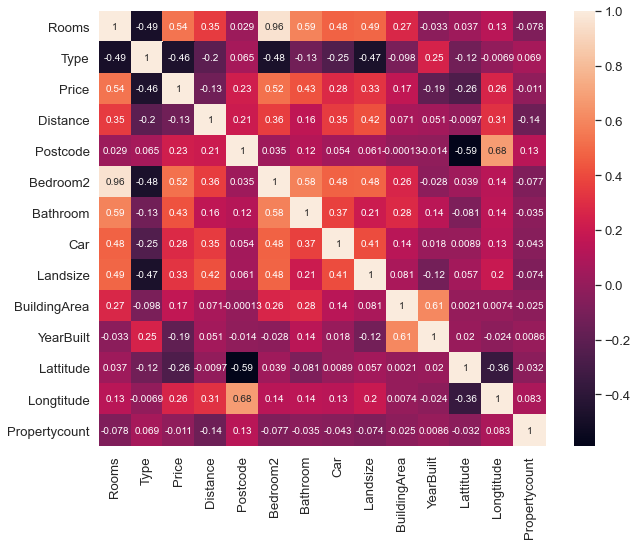

In [294]:
plt.figure(figsize = (10, 8))
sb.heatmap(df.corr(method = "spearman"), annot = True)

#### Data Cleaning

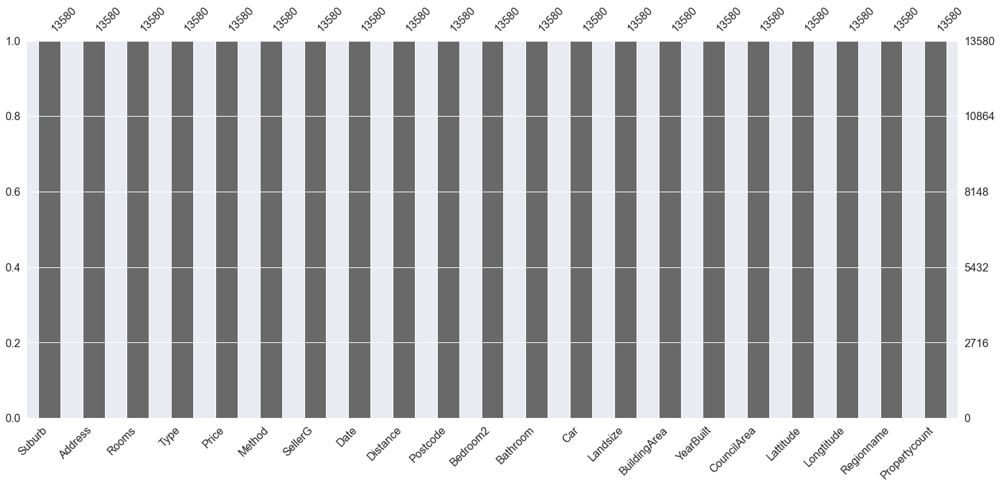

In [295]:
na_vals = msno.bar(df)

In [296]:
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,0,1480000.0,S,Biggin,2016-03-12,2.5,3067.0,2.0,1.0,1.0,202.0,0.0,0.0,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,0,1035000.0,S,Biggin,2016-04-02,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,0,1465000.0,SP,Biggin,2017-04-03,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,0,850000.0,PI,Biggin,2017-04-03,2.5,3067.0,3.0,2.0,1.0,94.0,0.0,0.0,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,0,1600000.0,VB,Nelson,2016-04-06,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [297]:
df["BuildingArea"] = df["BuildingArea"].fillna(value = 0)

In [298]:
df["YearBuilt"] = df["YearBuilt"].fillna(value = 0)

In [299]:
df["CouncilArea"] = df["CouncilArea"].fillna(value = "Missing Data")

In [300]:
df["Car"] = df["Car"].fillna(value = 0)

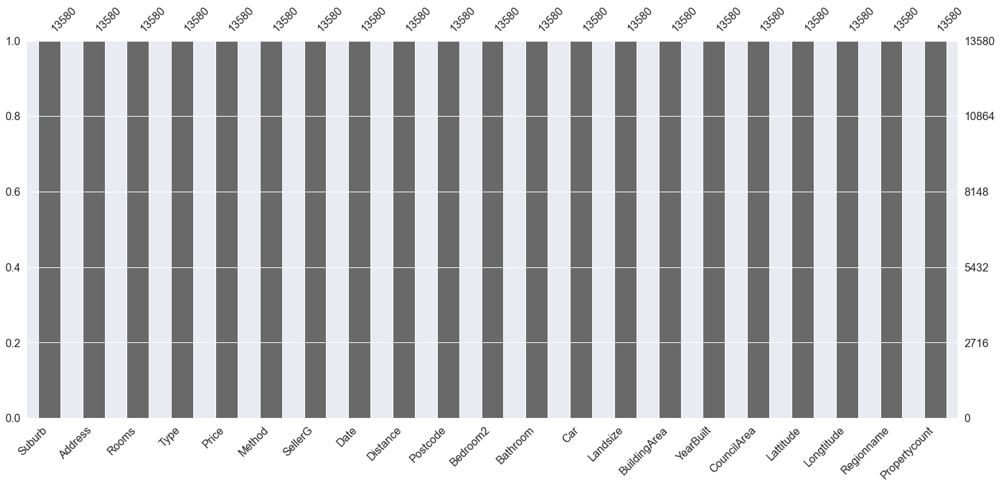

In [301]:
na_vals = msno.bar(df)

In [302]:
df["Date"] = pd.to_datetime(df["Date"])
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,0,1480000.0,S,Biggin,2016-03-12,2.5,3067.0,2.0,1.0,1.0,202.0,0.0,0.0,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,0,1035000.0,S,Biggin,2016-04-02,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,0,1465000.0,SP,Biggin,2017-04-03,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,0,850000.0,PI,Biggin,2017-04-03,2.5,3067.0,3.0,2.0,1.0,94.0,0.0,0.0,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,0,1600000.0,VB,Nelson,2016-04-06,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [303]:
df["Method"].value_counts()

S     9022
SP    1703
PI    1564
VB    1199
SA      92
Name: Method, dtype: int64

#### Create a algorithmic model that predicts the price of a House

In [304]:
df["Type"] = df["Type"].replace("h", 0)
df["Type"] = df["Type"].replace("u", 1)
df["Type"] = df["Type"].replace("t", 2)

X = df[["Rooms", "Type"]] # Input Variables
y = df["Price"] #Predictions Outcome

In [337]:
model = DecisionTreeClassifier()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

model.fit(X_train, y_train)
predict = model.predict(X_test)
score = accuracy_score(y_test, predict)
print(f'{round(score*100, 2)}')

0.7


In [338]:
new_price = []

In [339]:
#for i in model.predict(X_test):
one_bdrm = new_price.append(model.predict([[1, 0], [1, 1], [1, 2]]))
two_bdrm = new_price.append(model.predict([[2, 0], [2, 1], [2, 2]]))
three_bdrm = new_price.append(model.predict([[3, 0], [3, 1], [3, 2]]))
four_bdrm = new_price.append(model.predict([[4, 0], [4, 1], [4, 2]]))
five_bdrm = new_price.append(model.predict([[5, 0], [5, 1], [5, 2]]))
six_bdrm = new_price.append(model.predict([[6, 0], [6, 1], [6, 2]]))
seven_bdrm = new_price.append(model.predict([[7, 0], [7, 1], [7, 2]]))
eight_bdrm = new_price.append(model.predict([[8, 0], [8, 1], [8, 2]]))
ten_bdrm = new_price.append(model.predict([[10, 0], [10, 1], [10, 2]]))

In [340]:
bedroom = []
for i in range(1, 10):
    bedroom.append(i)
bedroom

[1, 2, 3, 4, 5, 6, 7, 8, 9]

In [341]:
price_df = pd.DataFrame(new_price, columns = ["h", "u", "t"])
bedrooms = pd.DataFrame(bedroom)
price_df["Bedrooms"] = bedrooms
#price_df[0, 1, 2] = price_df[0, 1, 2].rename(["h", "u", "t"], inplace=True)
#price_df[["h", "u", "t", "Bedrooms"]] = price_df["Bedrooms", "h", "u", "t"]
price_df.set_index(price_df["Bedrooms"], inplace=True)
price_df.drop(columns = ["Bedrooms"], inplace=True)
price_df.reset_index(inplace=True)
price_df["Bedrooms"] = price_df["Bedrooms"].replace(9, 10)
price_df.astype("int64")

,Bedrooms,h,u,t
0,1,280000,380000,345000
1,2,1000000,600000,600000
2,3,1100000,700000,800000
3,4,1300000,540000,950000
4,5,1400000,540000,645000
5,6,1900000,520000,645000
6,7,1350000,520000,645000
7,8,741000,2250000,645000
8,10,900000,2250000,645000


Text(0.5, 1.0, 'Price Range Prediction Model \nFor Houses in Melbourne')

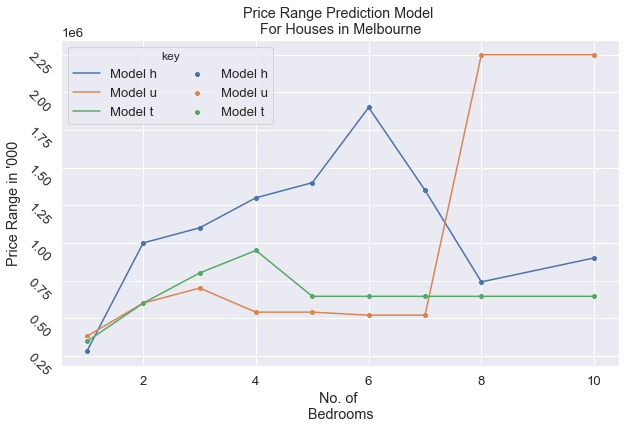

In [342]:
plt.figure(figsize = (10, 6))
sb.lineplot(y = price_df["h"], x = price_df["Bedrooms"], data = price_df, label = "Model h")
sb.scatterplot(y = price_df["h"], x = price_df["Bedrooms"], data = price_df, label = "Model h")

sb.lineplot(y = price_df["u"], x = price_df["Bedrooms"], data = price_df, label = "Model u")
sb.scatterplot(y = price_df["u"], x = price_df["Bedrooms"], data = price_df, label = "Model u")

sb.lineplot(y = price_df["t"], x = price_df["Bedrooms"], data = price_df, label = "Model t")
sb.scatterplot(y = price_df["t"], x = price_df["Bedrooms"], data = price_df, label = "Model t")

plt.xlabel("No. of \nBedrooms")
plt.ylabel("Price Range in '000")
plt.yticks(rotation = -45)
plt.legend(ncol = 2, title = "key")
plt.title("Price Range Prediction Model \nFor Houses in Melbourne")

TypeError: 'AxesSubplot' object is not subscriptable

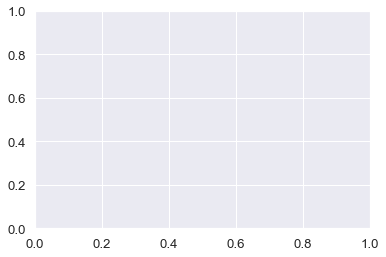

In [343]:
fig, ax = plt.subplots(1, 1)

ax[0].lineplot(x = price_df["h"] , y = price_df["Bedrooms"], data = price_df)

ax[1] = sb.lineplot(x = price_df["Bedrooms"], y = price_df["u"], data = price_df)

ax[2] = sb.lineplot(x = price_df["Bedrooms"], y = price_df["t"], data = price_df)

plt.show()

In [ ]:
df["Rooms"].value_counts()

In [ ]:
X_test

In [ ]:
y_test

In [ ]:
new_price 